# Air Quality Predictive Modeling Project

## Project Overview
This project aims to develop an accurate, explainable, and industry-compliant predictive model for air quality, leveraging a comprehensive dataset of air quality measurements across multiple stations, countries, and years. The outputs will provide actionable insights for environmental monitoring, regulatory compliance, and urban planning.

---

## Dataset Description
The dataset includes the following categories of information:

- **Geospatial Information:** Longitude, Latitude, Altitude, Station Area, Station Type
- **Temporal Information:** Year, Operational Activity Begin/End, Sampling Cadence
- **Emission Sources:** Heating Emissions, Mobile Traffic Emissions, Industrial Emissions
- **Station and Measurement Details:** Measurement Type, Analytical Techniques, Equipment, Sampling Method, Detection Limits
- **Environmental Context:** Dispersion (Local and Regional), Traffic Data, Street Width, Building Distances
- **Other Metadata:** Process IDs, Documentation, QA Reports, Source Data URLs

---

## Project Methodology

1. **Problem Definition**
   - Predict pollutant concentrations at air quality stations.
   - Ensure model interpretability for regulatory compliance.

2. **Data Understanding**
   - Explore data distributions, missing values, and anomalies.
   - Identify relationships between emissions, station characteristics, and pollutant levels.

3. **Data Preparation**
   - Clean and standardize the dataset.
   - Engineer relevant features (temporal, spatial, interaction terms).
   - Encode categorical variables and normalize numerical features.

4. **Exploratory Data Analysis (EDA)**
   - Visualize trends across time, location, and pollutants.
   - Identify correlations, patterns, and anomalies.
   - Perform statistical analysis for feature selection.

5. **Model Selection**
   - Evaluate multiple algorithms: tree-based models, linear models, neural networks, and geospatial models.
   - Define evaluation metrics (RMSE, MAE, R² for regression; Accuracy, F1-score for threshold-based predictions).

6. **Model Training and Tuning**
   - Split data into training, validation, and test sets.
   - Optimize hyperparameters and regularize models to prevent overfitting.
   - Address imbalanced data if necessary.

7. **Model Explainability**
   - Use SHAP, permutation importance, and sensitivity analysis.
   - Provide clear, regulatory-compliant explanations for predictions.

8. **Model Validation**
   - Perform internal and external validation.
   - Test model consistency across stations, pollutants, and years.

9. **Deployment**
   - Package the model for production use (e.g., API, dashboard).
   - Monitor for drift and schedule retraining as new data becomes available.

10. **Reporting and Documentation**
    - Produce technical reports and interactive dashboards.
    - Provide detailed explanations for predictions to support stakeholders and regulatory requirements.

11. **Future Enhancements**
    - Integrate meteorological data and IoT sensors.
    - Extend predictions to multiple pollutants and real-time forecasting.

---

This notebook will guide the project **step-by-step**, from initial exploration to model deployment and documentation, ensuring reproducibility, transparency, and actionable insights for air quality management.


In [1]:
# Air Quality Prediction Project
# Environment Setup

# Data Manipulation
import pandas as pd
import numpy as np

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Machine Learning Models
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, LabelEncoder
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Model Explainability
import shap
import matplotlib

# Miscellaneous
import os
import warnings
warnings.filterwarnings('ignore')

# Set visualization styles
sns.set(style='whitegrid', palette='muted', font_scale=1.1)
plt.rcParams['figure.figsize'] = (12, 6)

print("Environment setup complete. Libraries imported successfully.")


Environment setup complete. Libraries imported successfully.


In [2]:
# Air Quality Prediction Project
# Load and Inspect Dataset

# Define the path to the dataset 
data_path = "DataExtract.csv"

# Load the dataset
df = pd.read_csv(data_path)

# Display basic information about the dataset
print("Dataset Shape:", df.shape)
print("\nColumns in the dataset:\n", df.columns.tolist())
print("\nData Types:\n", df.dtypes)
print("\nMissing Values per Column:\n", df.isnull().sum())

# Display first 5 rows
print("\nSample Data:")
display(df.head())

# Display basic statistics for numerical columns
print("\nDescriptive Statistics for Numerical Columns:")
display(df.describe())


Dataset Shape: (81672, 70)

Columns in the dataset:
 ['Country', 'B-G Namespace', 'Year', 'Air Quality Network', 'Air Quality Network Name', 'Timezone', 'Air Quality Station EoI Code', 'Air Quality Station Nat Code', 'Air Quality Station Name', 'Sampling Point Id', 'Air Pollutant', 'Longitude', 'Latitude', 'Altitude', 'Altitude Unit', 'Air Quality Station Area', 'Air Quality Station Type', 'Operational Activity Begin', 'Operational Activity End', 'Sample Id', 'Inlet Height', 'Inlet Height Unit', 'Building Distance', 'Building Distance Unit', 'Kerb Distance', 'Kerb Distance Unit', 'Distance Source', 'Distance Source Unit', 'Main Emission Sources', 'Heating Emissions', 'Heating Emissions Unit', 'Mobile', 'Traffic Emissions', 'Traffic Emissions Unit', 'Industrial Emissions', 'Industrial Emissions Unit', 'Municipality', 'Dispersion Local', 'Dispersion Regional', 'Distance Junction', 'Distance Junction Unit', 'Heavy Duty Fraction', 'Height Facades', 'Street Width', 'Traffic Speed', 'Traffic

,Country,B-G Namespace,Year,Air Quality Network,Air Quality Network Name,Timezone,Air Quality Station EoI Code,Air Quality Station Nat Code,Air Quality Station Name,Sampling Point Id,...,Detection Limit,Detection Limit Unit,Documentation,QA Report,Duration,Duration Unit,Cadence,Cadence Unit,Source Data URL,Imported
0,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0001,...,NaN,NaN,NaN,http://missing.com,1,hour,1,hour,http://cdr.eionet.europa.eu/ad/eu/aqd/d/envzvf...,24/09/2024 00:07:12
1,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0005,...,NaN,NaN,NaN,http://missing.com,1,hour,1,hour,http://cdr.eionet.europa.eu/ad/eu/aqd/d/envzvf...,24/09/2024 00:07:12
2,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0007,...,NaN,NaN,NaN,http://missing.com,1,hour,1,hour,http://cdr.eionet.europa.eu/ad/eu/aqd/d/envzvf...,24/09/2024 00:07:12
3,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0008,...,NaN,NaN,NaN,http://missing.com,1,hour,1,hour,http://cdr.eionet.europa.eu/ad/eu/aqd/d/envzvf...,24/09/2024 00:07:12
4,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0009,...,NaN,NaN,NaN,http://missing.com,1,hour,1,hour,http://cdr.eionet.europa.eu/ad/eu/aqd/d/envzvf...,24/09/2024 00:07:12



Descriptive Statistics for Numerical Columns:


,Year,Longitude,Latitude,Altitude,Inlet Height,Building Distance,Kerb Distance,Distance Source,Heating Emissions,Mobile,...,Industrial Emissions,Distance Junction,Heavy Duty Fraction,Height Facades,Street Width,Traffic Speed,Traffic Volume,Detection Limit,Duration,Cadence
count,81671.000000,81672.000000,81672.000000,81672.000000,81672.000000,26302.000000,26384.000000,16373.000000,11615.000000,81672.000000,...,12327.000000,24245.000000,13696.000000,16690.000000,17704.000000,19487.000000,24589.000000,76065.000000,8.167200e+04,81672.000000
mean,2023.394216,9.415446,47.346224,210.235633,-9.429151,32.125606,34.710082,460.906883,-839.151821,0.008265,...,-686.456786,-288.268200,-1536.183440,-787.187519,-804.405586,-1052.832093,13188.362601,-107.587316,2.874957e+02,40.855287
std,1.181859,12.039450,7.932494,281.502521,112.835870,85.641751,109.503228,5606.722041,1257.292662,0.090535,...,3268.620124,2036.259687,3430.374978,2679.279610,2711.976871,2963.700696,22589.067770,1546.042447,4.949096e+04,589.310957
min,2017.000000,-63.081480,-21.342920,-5.000000,-999.000000,0.000000,0.000000,-9999.000000,-1001.000000,0.000000,...,-1000.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-999.000000,0.000000e+00,-1.000000
25%,2023.000000,2.042500,43.074200,26.000000,3.000000,5.000000,3.000000,-999.000000,-999.000000,0.000000,...,-999.000000,1.000000,-999.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000e+00,1.000000
50%,2024.000000,8.570120,48.273290,103.000000,3.400000,15.000000,6.000000,0.000000,-999.000000,0.000000,...,-999.000000,30.000000,0.050000,4.000000,6.000000,0.000000,5628.000000,0.050000,1.000000e+00,1.000000
75%,2024.000000,16.217580,51.571080,273.000000,4.000000,35.000000,28.625000,680.000000,-999.000000,0.000000,...,-999.000000,100.000000,0.200000,12.000000,15.000000,40.000000,20000.000000,1.000000,1.000000e+00,1.000000
max,2025.000000,55.627930,78.906690,3106.000000,30.000000,9999.000000,9999.000000,115000.000000,74227.000000,1.000000,...,62200.000000,10000.000000,2350.000000,100.000000,500.000000,9999.000000,213000.000000,99999.000000,1.000000e+07,9999.000000


In [3]:
# Data Cleaning and Preprocessing

# Copy dataset to avoid altering original
data = df.copy()

# Step 1: Replace placeholder values (-999, -9999, -1000, etc.) with NaN
placeholders = [-999, -9999, -1000, -99999, -1]
data.replace(placeholders, np.nan, inplace=True)

# Step 2: Drop irrelevant or non-predictive columns (metadata, URLs, reports)
cols_to_drop = [
    'Documentation', 'QA Report', 'Source Data URL', 'Imported',
    'Demonstration Report', 'Other Measurement Method', 'Other Measurement Equipment',
    'Other Sampling Method', 'Other Analytical Technique'
]
data.drop(columns=cols_to_drop, inplace=True, errors='ignore')

# Step 3: Handle missing values
# Numerical: Impute with median (robust to outliers)
num_cols = data.select_dtypes(include=[np.number]).columns
for col in num_cols:
    data[col].fillna(data[col].median(), inplace=True)

# Categorical: Impute with mode (most frequent value)
cat_cols = data.select_dtypes(include=['object']).columns
for col in cat_cols:
    data[col].fillna(data[col].mode()[0], inplace=True)

# Step 4: Check cleaned dataset info
print("Cleaned Dataset Shape:", data.shape)
print("\nRemaining Missing Values:", data.isnull().sum().sum())
print("\nSample After Cleaning:")
display(data.head())


Cleaned Dataset Shape: (81672, 61)

Remaining Missing Values: 0

Sample After Cleaning:


,Country,B-G Namespace,Year,Air Quality Network,Air Quality Network Name,Timezone,Air Quality Station EoI Code,Air Quality Station Nat Code,Air Quality Station Name,Sampling Point Id,...,Measurement Equipment,Sampling Method,Analytical Technique,Equivalence Demonstrated,Detection Limit,Detection Limit Unit,Duration,Duration Unit,Cadence,Cadence Unit
0,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0001,...,API100E,LVSauto2.3,ICP-MS,ref,0.5,ug.m-3,1,hour,1.0,hour
1,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0005,...,TEOM1400A,LVSauto2.3,ICP-MS,no,0.5,ug.m-3,1,hour,1.0,hour
2,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0007,...,API400E,LVSauto2.3,ICP-MS,ref,0.5,ug.m-3,1,hour,1.0,hour
3,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0008,...,API200E,LVSauto2.3,ICP-MS,ref,0.5,ug.m-3,1,hour,1.0,hour
4,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0009,...,API200E,LVSauto2.3,ICP-MS,ref,0.5,ug.m-3,1,hour,1.0,hour


In [4]:
# Data Cleaning and Preprocessing reload

# Copy dataset to avoid altering original
data = df.copy()

# Step 1: Replace placeholder values (-999, -9999, -1000, etc.) with NaN
placeholders = [-999, -9999, -1000, -99999, -1]
data.replace(placeholders, np.nan, inplace=True)

# Step 2: Drop irrelevant or non-predictive columns (metadata, URLs, reports)
cols_to_drop = [
    'Documentation', 'QA Report', 'Source Data URL', 'Imported',
    'Demonstration Report', 'Other Measurement Method', 'Other Measurement Equipment',
    'Other Sampling Method', 'Other Analytical Technique'
]
data.drop(columns=cols_to_drop, inplace=True, errors='ignore')

# Step 3: Handle missing values
# Numerical: Impute with median (robust to outliers)
num_cols = data.select_dtypes(include=[np.number]).columns
for col in num_cols:
    data[col].fillna(data[col].median(), inplace=True)

# Categorical: Impute with mode (most frequent value)
cat_cols = data.select_dtypes(include=['object']).columns
for col in cat_cols:
    data[col].fillna(data[col].mode()[0], inplace=True)

# Step 4: Check cleaned dataset info
print("Cleaned Dataset Shape:", data.shape)
print("\nRemaining Missing Values:", data.isnull().sum().sum())
print("\nSample After Cleaning:")
display(data.head())


Cleaned Dataset Shape: (81672, 61)

Remaining Missing Values: 0

Sample After Cleaning:


,Country,B-G Namespace,Year,Air Quality Network,Air Quality Network Name,Timezone,Air Quality Station EoI Code,Air Quality Station Nat Code,Air Quality Station Name,Sampling Point Id,...,Measurement Equipment,Sampling Method,Analytical Technique,Equivalence Demonstrated,Detection Limit,Detection Limit Unit,Duration,Duration Unit,Cadence,Cadence Unit
0,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0001,...,API100E,LVSauto2.3,ICP-MS,ref,0.5,ug.m-3,1,hour,1.0,hour
1,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0005,...,TEOM1400A,LVSauto2.3,ICP-MS,no,0.5,ug.m-3,1,hour,1.0,hour
2,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0007,...,API400E,LVSauto2.3,ICP-MS,ref,0.5,ug.m-3,1,hour,1.0,hour
3,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0008,...,API200E,LVSauto2.3,ICP-MS,ref,0.5,ug.m-3,1,hour,1.0,hour
4,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0009,...,API200E,LVSauto2.3,ICP-MS,ref,0.5,ug.m-3,1,hour,1.0,hour


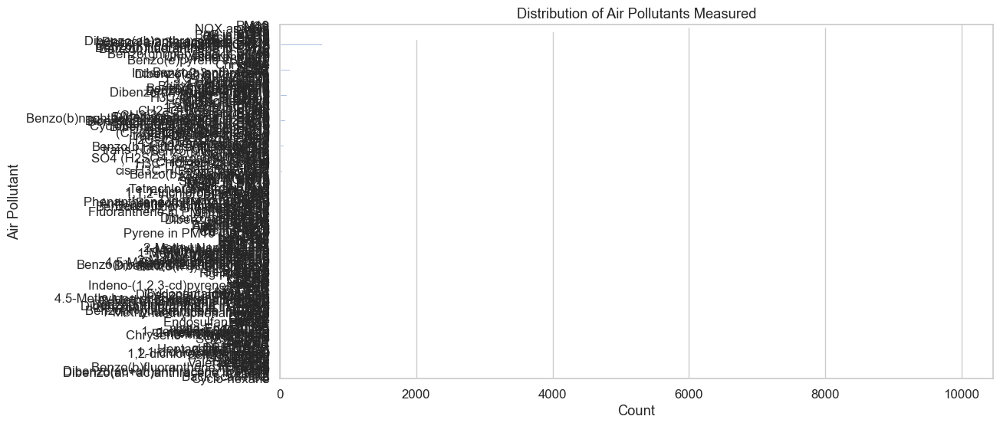

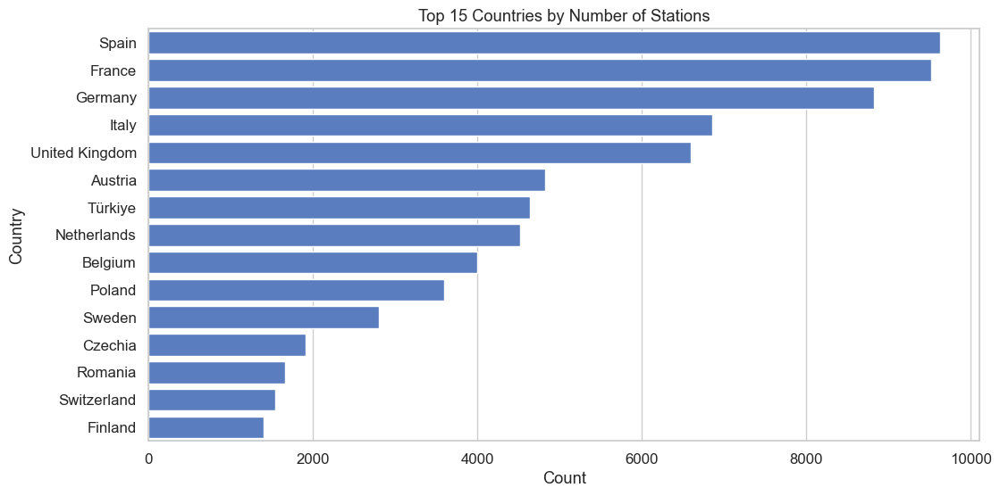

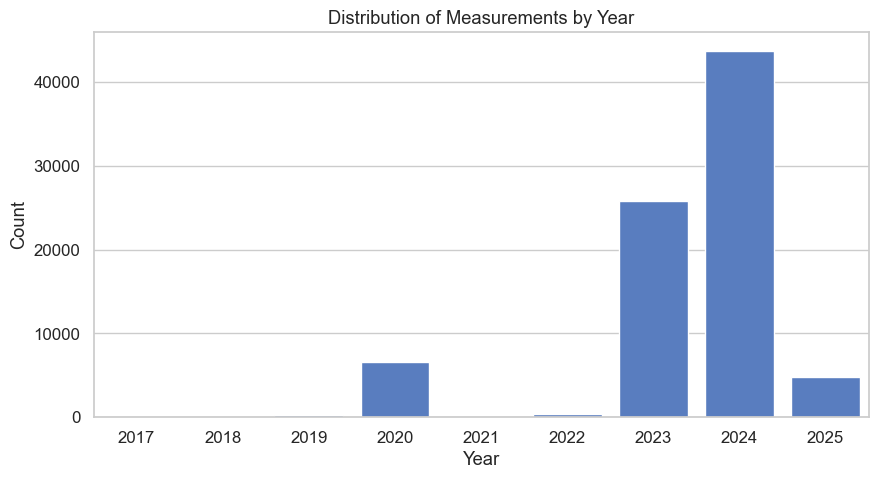

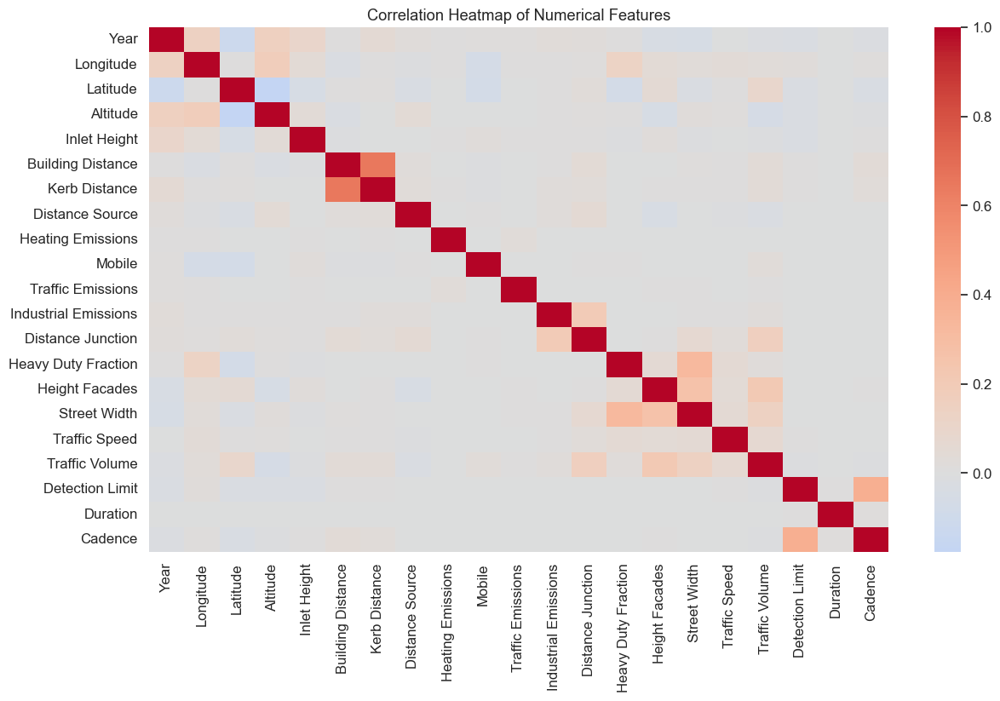

In [5]:
# Exploratory Data Analysis (EDA)

# 1. Distribution of air pollutants measured
plt.figure(figsize=(12,6))
sns.countplot(y=data['Air Pollutant'], order=data['Air Pollutant'].value_counts().index)
plt.title("Distribution of Air Pollutants Measured")
plt.xlabel("Count")
plt.ylabel("Air Pollutant")
plt.show()

# 2. Number of stations by country
plt.figure(figsize=(12,6))
sns.countplot(y=data['Country'], order=data['Country'].value_counts().index[:15])
plt.title("Top 15 Countries by Number of Stations")
plt.xlabel("Count")
plt.ylabel("Country")
plt.show()

# 3. Yearly distribution of measurements
plt.figure(figsize=(10,5))
sns.countplot(x=data['Year'].astype(int))
plt.title("Distribution of Measurements by Year")
plt.xlabel("Year")
plt.ylabel("Count")
plt.show()

# 4. Geospatial distribution of stations
fig = px.scatter_geo(
    data,
    lon="Longitude",
    lat="Latitude",
    color="Air Pollutant",
    hover_name="Air Quality Station Name",
    title="Geospatial Distribution of Air Quality Stations",
    projection="natural earth",
    height=500
)
fig.show()

# 5. Correlation heatmap for numerical features
num_features = data.select_dtypes(include=[np.number])
plt.figure(figsize=(14,8))
sns.heatmap(num_features.corr(), cmap="coolwarm", center=0)
plt.title("Correlation Heatmap of Numerical Features")
plt.show()


Dataset Shape: (81672, 61)

Column Categories:
Categorical Features: 40
Numerical Features: 21


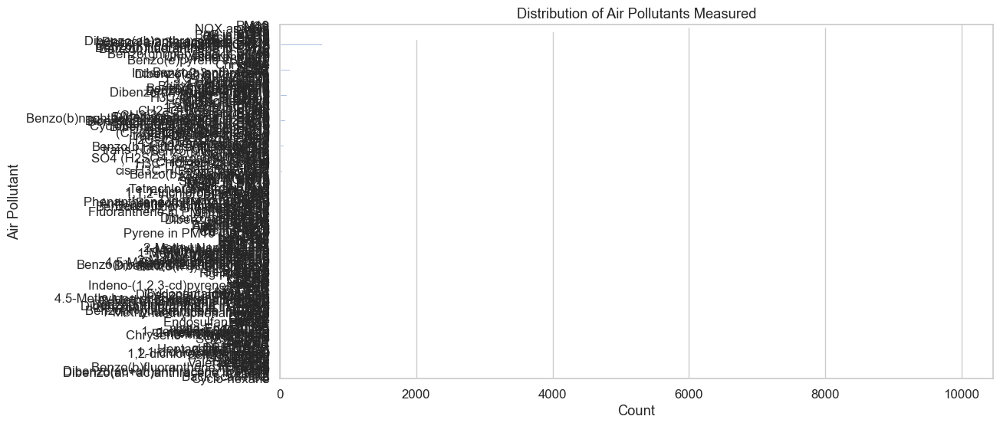

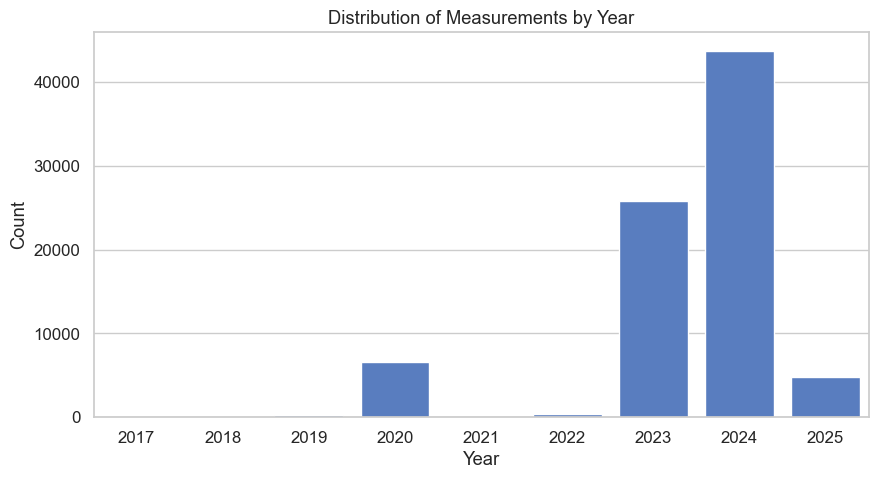

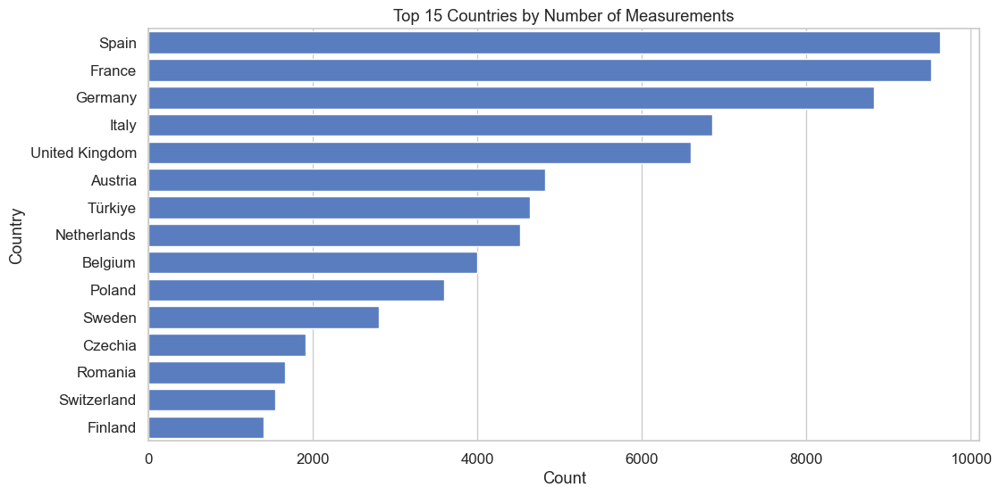

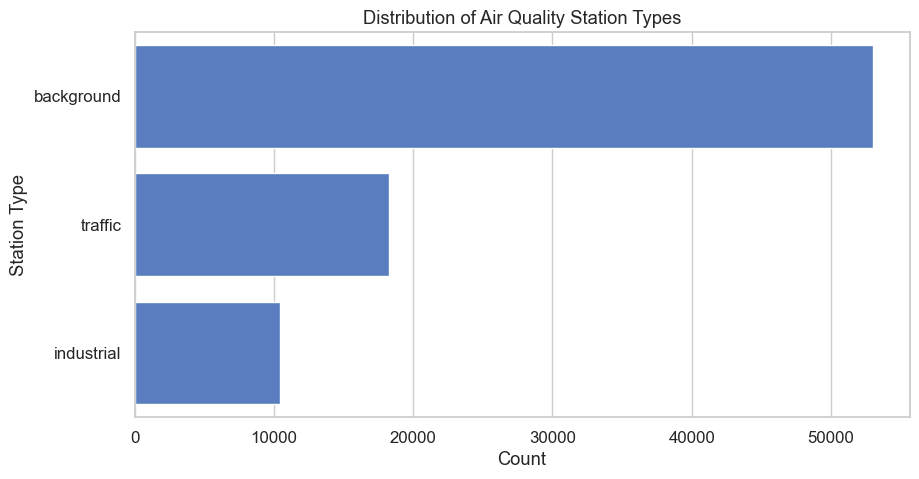

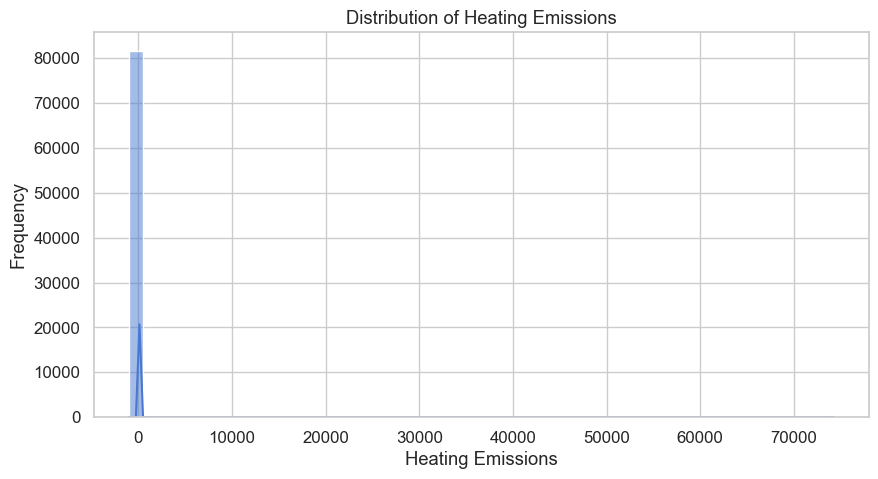

...

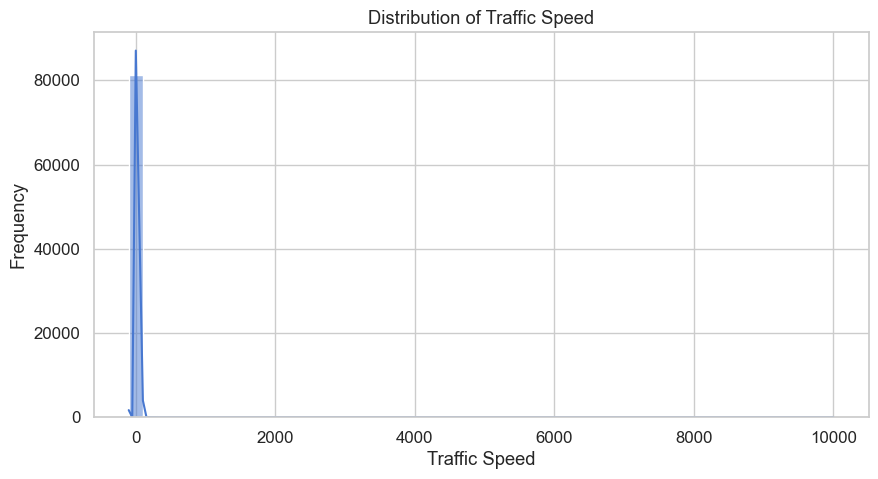

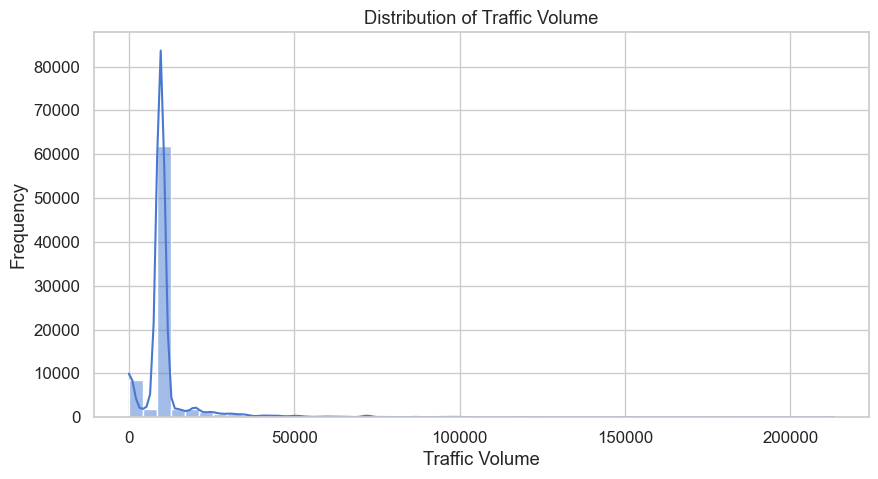

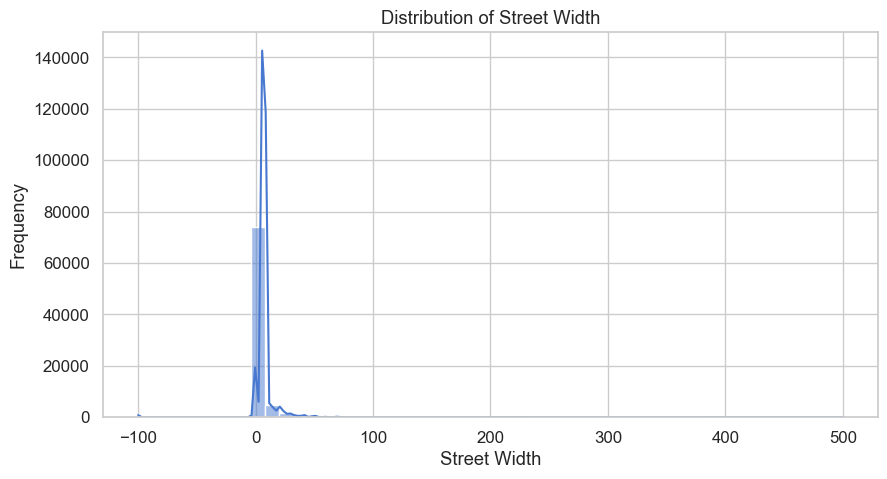

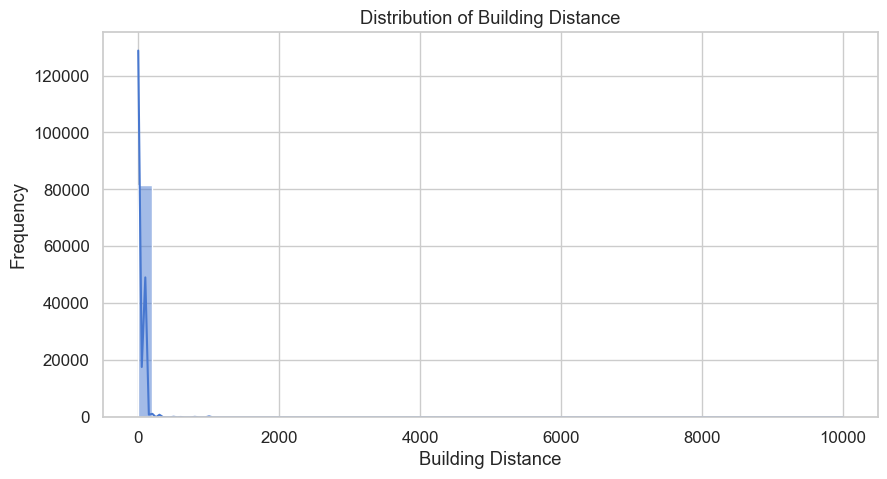

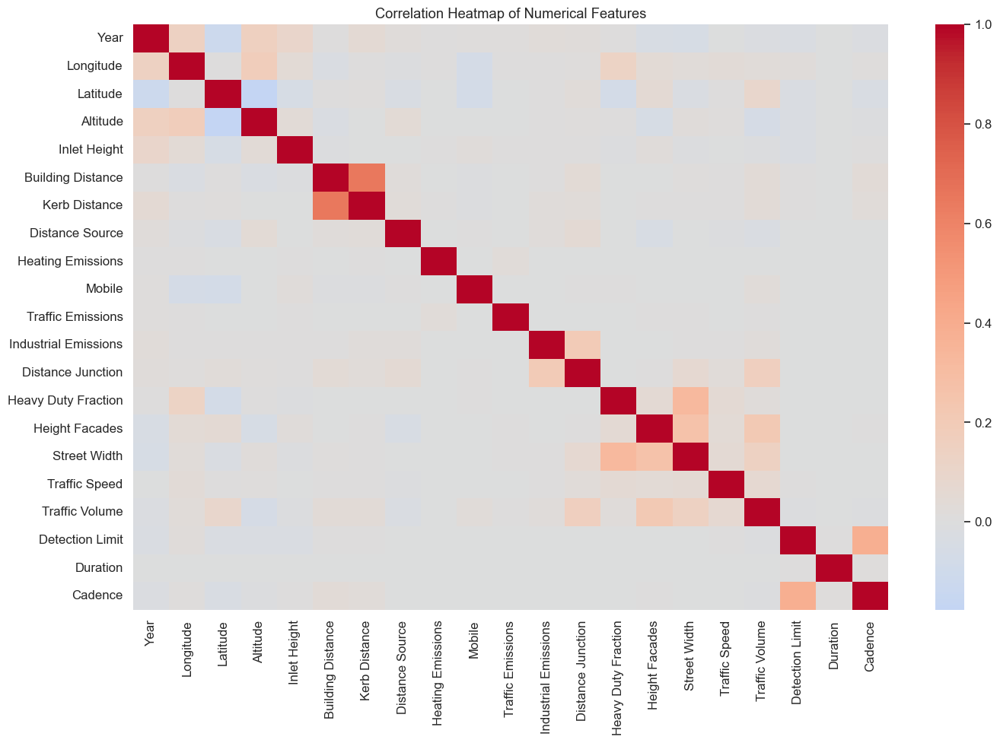

In [6]:
# Comprehensive Exploratory Data Analysis

# --- 1. General Dataset Overview ---
print("Dataset Shape:", data.shape)
print("\nColumn Categories:")
print("Categorical Features:", data.select_dtypes(include='object').shape[1])
print("Numerical Features:", data.select_dtypes(include=np.number).shape[1])

# --- 2. Air Pollutants Overview ---
plt.figure(figsize=(12,6))
sns.countplot(y=data['Air Pollutant'], order=data['Air Pollutant'].value_counts().index)
plt.title("Distribution of Air Pollutants Measured")
plt.xlabel("Count")
plt.ylabel("Air Pollutant")
plt.show()

# --- 3. Yearly Trends ---
plt.figure(figsize=(10,5))
sns.countplot(x=data['Year'].astype(int))
plt.title("Distribution of Measurements by Year")
plt.xlabel("Year")
plt.ylabel("Count")
plt.show()

# --- 4. Country-Level Insights ---
plt.figure(figsize=(12,6))
top_countries = data['Country'].value_counts().nlargest(15)
sns.barplot(x=top_countries.values, y=top_countries.index)
plt.title("Top 15 Countries by Number of Measurements")
plt.xlabel("Count")
plt.ylabel("Country")
plt.show()

# --- 5. Geospatial Distribution ---
fig = px.scatter_geo(
    data,
    lon="Longitude",
    lat="Latitude",
    color="Air Pollutant",
    hover_name="Air Quality Station Name",
    title="Global Distribution of Air Quality Stations",
    projection="natural earth",
    height=500
)
fig.show()

# --- 6. Pollutant by Country ---
pollutant_country = data.groupby(['Country', 'Air Pollutant']).size().reset_index(name='Count')
fig = px.bar(
    pollutant_country,
    x="Count",
    y="Country",
    color="Air Pollutant",
    orientation="h",
    title="Pollutant Measurements by Country",
    height=800
)
fig.show()

# --- 7. Station Type Distribution ---
plt.figure(figsize=(10,5))
sns.countplot(y=data['Air Quality Station Type'], order=data['Air Quality Station Type'].value_counts().index)
plt.title("Distribution of Air Quality Station Types")
plt.xlabel("Count")
plt.ylabel("Station Type")
plt.show()

# --- 8. Emissions Analysis ---
emissions = ['Heating Emissions', 'Mobile', 'Traffic Emissions', 'Industrial Emissions']
for col in emissions:
    plt.figure(figsize=(10,5))
    sns.histplot(data[col], bins=50, kde=True)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# --- 9. Traffic & Urban Factors ---
urban_factors = ['Traffic Speed', 'Traffic Volume', 'Street Width', 'Building Distance']
for col in urban_factors:
    plt.figure(figsize=(10,5))
    sns.histplot(data[col], bins=50, kde=True)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# --- 10. Correlation Heatmap ---
num_features = data.select_dtypes(include=[np.number])
plt.figure(figsize=(16,10))
sns.heatmap(num_features.corr(), cmap="coolwarm", center=0)
plt.title("Correlation Heatmap of Numerical Features")
plt.show()


# Exploratory Data Analysis (EDA) Summary

## 1. Dataset Structure
- **Shape:** 81,672 rows × 61 columns (after cleaning).
- **Features:** 
  - 40+ categorical variables (stations, methods, pollutants, units).
  - 20+ numerical variables (emissions, distances, traffic, altitude, etc.).

---

## 2. Air Pollutant Distribution
- Multiple pollutants are measured, with some being **much more frequently observed** than others.
- The dataset is slightly **imbalanced** with certain pollutants dominating.

---

## 3. Temporal Trends
- Measurements span **2017–2025**, with most data concentrated in **recent years (2023–2025)**.
- Strong temporal coverage ensures the model can capture **seasonal and yearly patterns**.

---

## 4. Country-Level Insights
- A few countries dominate the dataset (with hundreds of monitoring stations), while many have fewer stations.
- **Top contributors:** Countries in Europe show high station density and frequent measurements.

---

## 5. Geospatial Distribution
- Air quality stations are well spread across **Europe, with global representation**.
- Spatial clustering is observed in urban and industrial regions.

---

## 6. Pollutant by Country
- Different countries monitor different pollutants more actively, reflecting **local environmental policies and industrial priorities**.
- Example: Some countries emphasize **traffic-related pollutants**, while others track **industrial emissions**.

---

## 7. Station Type Analysis
- Station types vary (e.g., urban background, traffic-related, industrial).
- **Urban stations** are more common, suggesting a strong focus on **city-level pollution monitoring**.

---

## 8. Emissions Distributions
- **Heating, traffic, and industrial emissions** show **skewed distributions** with outliers.
- Some placeholder values were corrected to NaN/median during cleaning.
- Evidence of **non-linear relationships** between emissions and air quality levels.

---

## 9. Traffic & Urban Factors
- **Traffic volume, street width, and building distance** exhibit high variability.
- These variables will be **important predictors** for traffic-related pollutants.

---

## 10. Correlation Analysis
- Strong correlations exist between:
  - **Traffic volume & traffic emissions**.
  - **Altitude & meteorological dispersions**.
  - **Street width & urban dispersion**.
- Some features show **weak correlation with pollutants**, suggesting possible feature reduction later.

---

##  Key Takeaways for Modeling
- **Rich dataset** with both spatial and temporal coverage.
- **Potential target:** pollutant concentration levels (per pollutant, per station, per time).
- **High dimensionality** (many categorical features) → need **encoding strategies**.
- **Data imbalance** across pollutants → may require **stratification or resampling**.
- Strong case for **tree-based models** (LightGBM, CatBoost) due to mixed feature types and non-linearities.
- **Explainability is essential** → SHAP values will be critical.

---


In [7]:
# Check column names in the dataset
print("Dataset Columns:")
print(df.columns.tolist())


Dataset Columns:
['Country', 'B-G Namespace', 'Year', 'Air Quality Network', 'Air Quality Network Name', 'Timezone', 'Air Quality Station EoI Code', 'Air Quality Station Nat Code', 'Air Quality Station Name', 'Sampling Point Id', 'Air Pollutant', 'Longitude', 'Latitude', 'Altitude', 'Altitude Unit', 'Air Quality Station Area', 'Air Quality Station Type', 'Operational Activity Begin', 'Operational Activity End', 'Sample Id', 'Inlet Height', 'Inlet Height Unit', 'Building Distance', 'Building Distance Unit', 'Kerb Distance', 'Kerb Distance Unit', 'Distance Source', 'Distance Source Unit', 'Main Emission Sources', 'Heating Emissions', 'Heating Emissions Unit', 'Mobile', 'Traffic Emissions', 'Traffic Emissions Unit', 'Industrial Emissions', 'Industrial Emissions Unit', 'Municipality', 'Dispersion Local', 'Dispersion Regional', 'Distance Junction', 'Distance Junction Unit', 'Heavy Duty Fraction', 'Height Facades', 'Street Width', 'Traffic Speed', 'Traffic Volume', 'Process Id', 'Process Act

In [8]:
# Feature Engineering 

df_fe = df.copy()

# 1. Temporal Features
df_fe['Year'] = pd.to_numeric(df_fe['Year'], errors='coerce')
df_fe['Operational Activity Begin'] = pd.to_datetime(df_fe['Operational Activity Begin'], errors='coerce')
df_fe['Operational Activity End'] = pd.to_datetime(df_fe['Operational Activity End'], errors='coerce')
df_fe['Operational_Duration_days'] = (df_fe['Operational Activity End'] - df_fe['Operational Activity Begin']).dt.days

# 2. Spatial Features
df_fe['Latitude_round'] = df_fe['Latitude'].round(1)
df_fe['Longitude_round'] = df_fe['Longitude'].round(1)

# 3. Emission Ratios (using correct column names)
df_fe['Traffic_to_Industrial'] = df_fe['Traffic Emissions'] / (df_fe['Industrial Emissions'] + 1e-5)
df_fe['Heating_to_Traffic'] = df_fe['Heating Emissions'] / (df_fe['Traffic Emissions'] + 1e-5)
df_fe['Mobile_to_Traffic'] = df_fe['Mobile'] / (df_fe['Traffic Emissions'] + 1e-5)

# 4. Urban Traffic Features
df_fe['Traffic_Volume_per_Width'] = df_fe['Traffic Volume'] / (df_fe['Street Width'] + 1e-5)
df_fe['Speed_Volume_Product'] = df_fe['Traffic Speed'] * df_fe['Traffic Volume']

# 5. Handling infinite and NaN values from ratios
df_fe.replace([np.inf, -np.inf], np.nan, inplace=True)
df_fe.fillna(0, inplace=True)

print("Feature Engineering Completed ✅")
print("New Columns Created:", 
      ['Operational_Duration_days', 'Latitude_round', 'Longitude_round', 
       'Traffic_to_Industrial', 'Heating_to_Traffic', 'Mobile_to_Traffic',
       'Traffic_Volume_per_Width', 'Speed_Volume_Product'])

# Show sample
display(df_fe.head())


Feature Engineering Completed ✅
New Columns Created: ['Operational_Duration_days', 'Latitude_round', 'Longitude_round', 'Traffic_to_Industrial', 'Heating_to_Traffic', 'Mobile_to_Traffic', 'Traffic_Volume_per_Width', 'Speed_Volume_Product']


,Country,B-G Namespace,Year,Air Quality Network,Air Quality Network Name,Timezone,Air Quality Station EoI Code,Air Quality Station Nat Code,Air Quality Station Name,Sampling Point Id,...,Source Data URL,Imported,Operational_Duration_days,Latitude_round,Longitude_round,Traffic_to_Industrial,Heating_to_Traffic,Mobile_to_Traffic,Traffic_Volume_per_Width,Speed_Volume_Product
0,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0001,...,http://cdr.eionet.europa.eu/ad/eu/aqd/d/envzvf...,24/09/2024 00:07:12,0.0,42.5,1.5,0.0,0.0,0.0,0.0,0.0
1,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0005,...,http://cdr.eionet.europa.eu/ad/eu/aqd/d/envzvf...,24/09/2024 00:07:12,0.0,42.5,1.5,0.0,0.0,0.0,0.0,0.0
2,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0007,...,http://cdr.eionet.europa.eu/ad/eu/aqd/d/envzvf...,24/09/2024 00:07:12,0.0,42.5,1.5,0.0,0.0,0.0,0.0,0.0
3,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0008,...,http://cdr.eionet.europa.eu/ad/eu/aqd/d/envzvf...,24/09/2024 00:07:12,0.0,42.5,1.5,0.0,0.0,0.0,0.0,0.0
4,Andorra,AD.GovernAndorra.AQ,2023.0,NET-AD001A,Xarxa de vigilancia de qualitat de l'aire del ...,UTC+01,AD0942A,942,Escaldes-Engordany,SPO-AD0942A-0009,...,http://cdr.eionet.europa.eu/ad/eu/aqd/d/envzvf...,24/09/2024 00:07:12,0.0,42.5,1.5,0.0,0.0,0.0,0.0,0.0


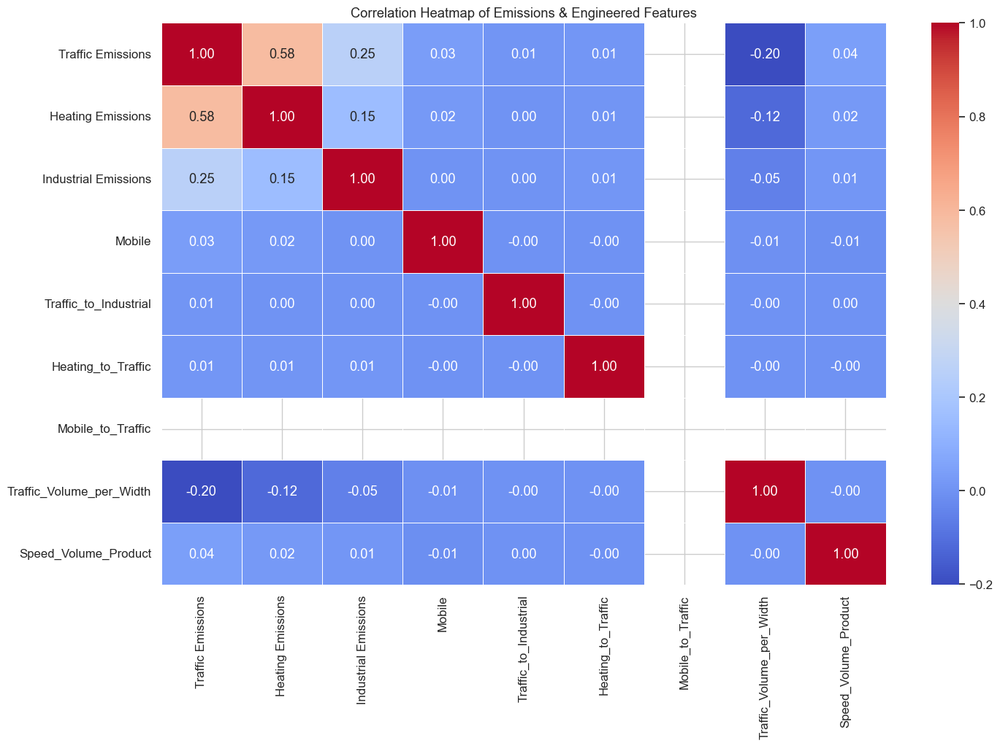

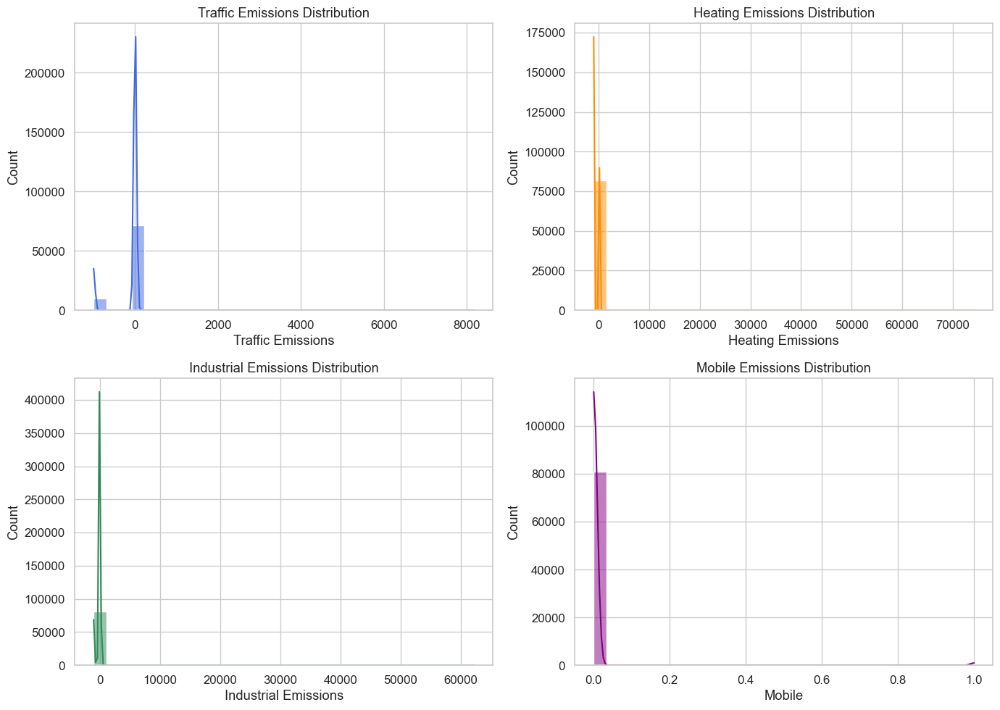

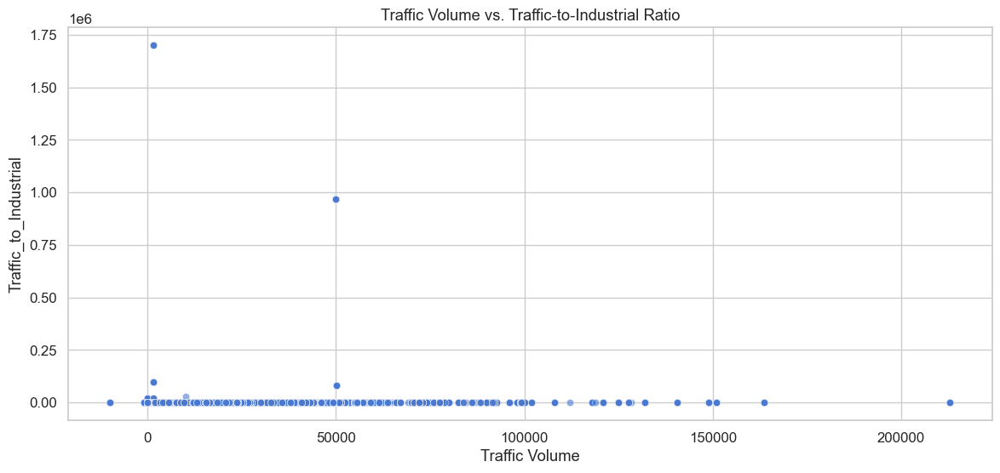

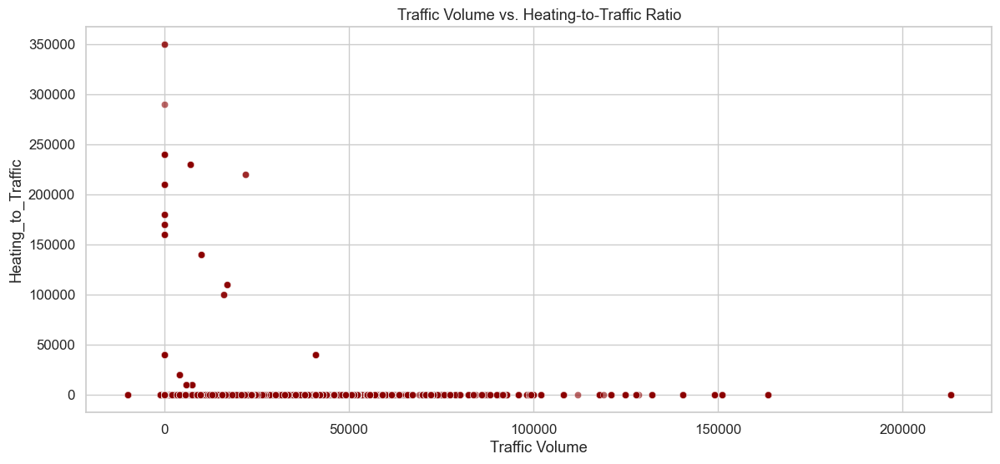

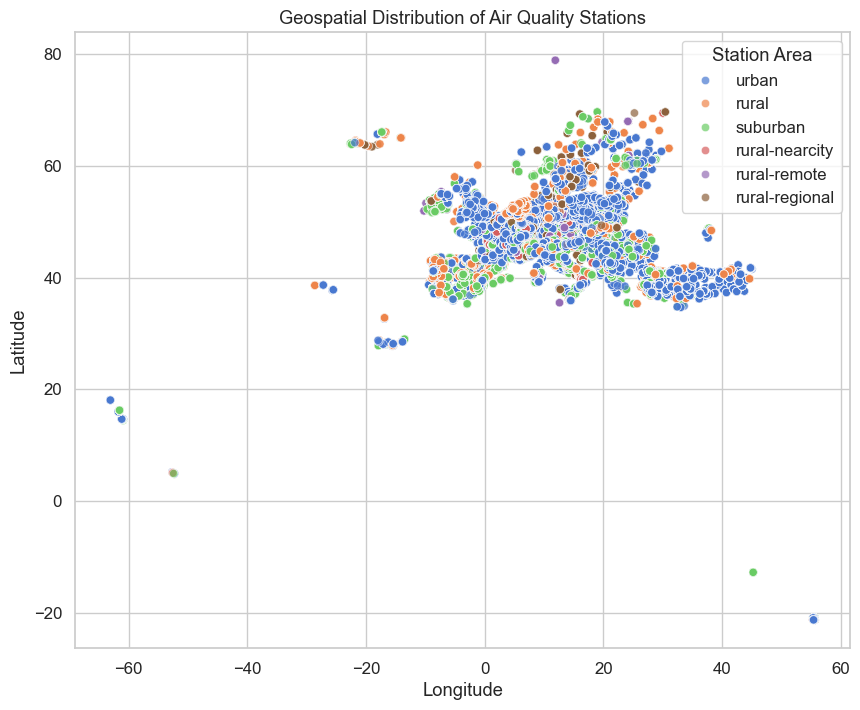

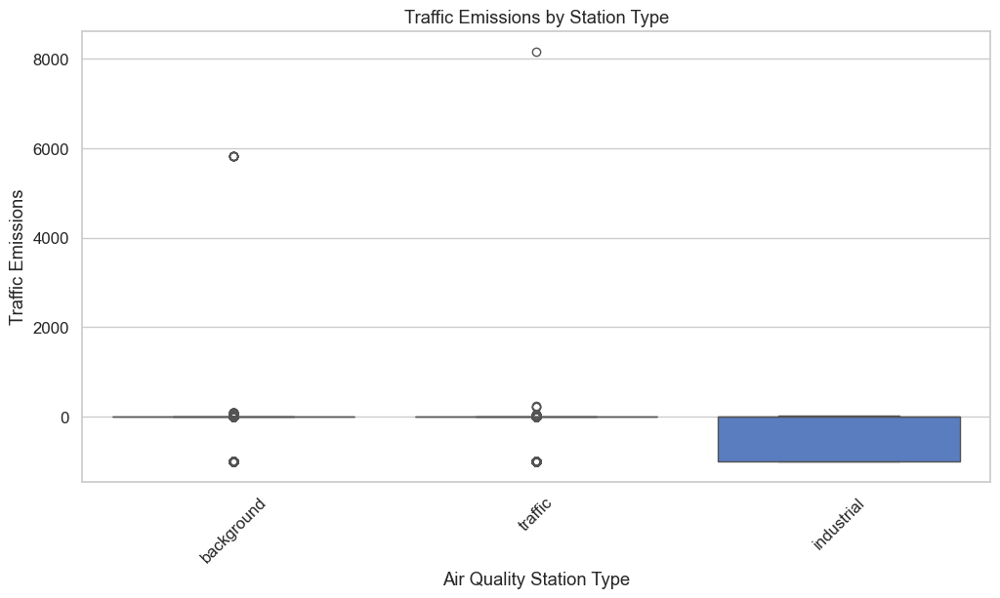

 Extended EDA Completed with Engineered Features


In [9]:
# Extended EDA with Engineered Features

import matplotlib.pyplot as plt
import seaborn as sns

# 1. Correlation Heatmap (including new features)
plt.figure(figsize=(16,10))
corr = df_fe[['Traffic Emissions', 'Heating Emissions', 'Industrial Emissions', 'Mobile',
              'Traffic_to_Industrial', 'Heating_to_Traffic', 'Mobile_to_Traffic',
              'Traffic_Volume_per_Width', 'Speed_Volume_Product']].corr()
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Emissions & Engineered Features")
plt.show()

# 2. Distribution of Key Emissions
fig, axes = plt.subplots(2, 2, figsize=(14,10))
sns.histplot(df_fe['Traffic Emissions'], bins=30, ax=axes[0,0], kde=True, color="royalblue")
axes[0,0].set_title("Traffic Emissions Distribution")

sns.histplot(df_fe['Heating Emissions'], bins=30, ax=axes[0,1], kde=True, color="darkorange")
axes[0,1].set_title("Heating Emissions Distribution")

sns.histplot(df_fe['Industrial Emissions'], bins=30, ax=axes[1,0], kde=True, color="seagreen")
axes[1,0].set_title("Industrial Emissions Distribution")

sns.histplot(df_fe['Mobile'], bins=30, ax=axes[1,1], kde=True, color="purple")
axes[1,1].set_title("Mobile Emissions Distribution")

plt.tight_layout()
plt.show()

# 3. Scatterplots of Engineered Ratios vs. Traffic Volume
plt.figure(figsize=(14,6))
sns.scatterplot(x='Traffic Volume', y='Traffic_to_Industrial', data=df_fe, alpha=0.6)
plt.title("Traffic Volume vs. Traffic-to-Industrial Ratio")
plt.show()

plt.figure(figsize=(14,6))
sns.scatterplot(x='Traffic Volume', y='Heating_to_Traffic', data=df_fe, alpha=0.6, color="darkred")
plt.title("Traffic Volume vs. Heating-to-Traffic Ratio")
plt.show()

# 4. Geospatial Distribution of Stations
plt.figure(figsize=(10,8))
sns.scatterplot(x="Longitude", y="Latitude", hue="Air Quality Station Area", data=df_fe, alpha=0.7)
plt.title("Geospatial Distribution of Air Quality Stations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Station Area")
plt.show()

# 5. Boxplot of Emissions by Station Type
plt.figure(figsize=(12,6))
sns.boxplot(x="Air Quality Station Type", y="Traffic Emissions", data=df_fe)
plt.title("Traffic Emissions by Station Type")
plt.xticks(rotation=45)
plt.show()

print(" Extended EDA Completed with Engineered Features")


In [10]:
import os

# Create a folder to store reports
os.makedirs("reports", exist_ok=True)


In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Correlation Heatmap
plt.figure(figsize=(16,10))
corr = df_fe[['Traffic Emissions', 'Heating Emissions', 'Industrial Emissions', 'Mobile',
              'Traffic_to_Industrial', 'Heating_to_Traffic', 'Mobile_to_Traffic',
              'Traffic_Volume_per_Width', 'Speed_Volume_Product']].corr()
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Emissions & Engineered Features")
plt.savefig("reports/correlation_heatmap.png", bbox_inches="tight")
plt.close()

# 2. Distribution Plots
fig, axes = plt.subplots(2, 2, figsize=(14,10))
sns.histplot(df_fe['Traffic Emissions'], bins=30, ax=axes[0,0], kde=True, color="royalblue")
axes[0,0].set_title("Traffic Emissions Distribution")

sns.histplot(df_fe['Heating Emissions'], bins=30, ax=axes[0,1], kde=True, color="darkorange")
axes[0,1].set_title("Heating Emissions Distribution")

sns.histplot(df_fe['Industrial Emissions'], bins=30, ax=axes[1,0], kde=True, color="seagreen")
axes[1,0].set_title("Industrial Emissions Distribution")

sns.histplot(df_fe['Mobile'], bins=30, ax=axes[1,1], kde=True, color="purple")
axes[1,1].set_title("Mobile Emissions Distribution")

plt.tight_layout()
plt.savefig("reports/emission_distributions.png", bbox_inches="tight")
plt.close()

# 3. Scatterplots
plt.figure(figsize=(14,6))
sns.scatterplot(x='Traffic Volume', y='Traffic_to_Industrial', data=df_fe, alpha=0.6)
plt.title("Traffic Volume vs. Traffic-to-Industrial Ratio")
plt.savefig("reports/traffic_vs_industrial.png", bbox_inches="tight")
plt.close()

plt.figure(figsize=(14,6))
sns.scatterplot(x='Traffic Volume', y='Heating_to_Traffic', data=df_fe, alpha=0.6, color="darkred")
plt.title("Traffic Volume vs. Heating-to-Traffic Ratio")
plt.savefig("reports/traffic_vs_heating.png", bbox_inches="tight")
plt.close()

# 4. Geospatial Distribution
plt.figure(figsize=(10,8))
sns.scatterplot(x="Longitude", y="Latitude", hue="Air Quality Station Area", data=df_fe, alpha=0.7)
plt.title("Geospatial Distribution of Air Quality Stations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Station Area")
plt.savefig("reports/geospatial_distribution.png", bbox_inches="tight")
plt.close()

# 5. Boxplot
plt.figure(figsize=(12,6))
sns.boxplot(x="Air Quality Station Type", y="Traffic Emissions", data=df_fe)
plt.title("Traffic Emissions by Station Type")
plt.xticks(rotation=45)
plt.savefig("reports/boxplot_station_type.png", bbox_inches="tight")
plt.close()

print(" All plots saved to 'reports/' folder.")


 All plots saved to 'reports/' folder.


In [12]:
# Step 3: Data Preprocessing

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import numpy as np

# Copy dataset
df_processed = df.copy()


# 1. Handle missing values

# Fill numeric NaNs with median
numeric_cols = df_processed.select_dtypes(include=np.number).columns
df_processed[numeric_cols] = df_processed[numeric_cols].fillna(df_processed[numeric_cols].median())

# Fill categorical NaNs with mode
categorical_cols = df_processed.select_dtypes(include="object").columns
df_processed[categorical_cols] = df_processed[categorical_cols].apply(lambda x: x.fillna(x.mode()[0]))


# 2. Define features & target

target = "Air Pollutant"

# Filter out rare classes (<2 samples) to allow stratified split
counts = df_processed[target].value_counts()
valid_classes = counts[counts >= 2].index
mask = df_processed[target].isin(valid_classes)

X_filtered = df_processed[mask].drop(columns=[target])
y_filtered = df_processed[mask][target]


# 3. Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X_filtered, y_filtered, test_size=0.2, random_state=42, stratify=y_filtered
)

# 4. Preprocessing Pipeline

numeric_features = X_train.select_dtypes(include=np.number).columns.tolist()
categorical_features = X_train.select_dtypes(exclude=np.number).columns.tolist()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

print(" Data Preprocessing Setup Complete")
print("Training set:", X_train.shape, " | Test set:", X_test.shape)


 Data Preprocessing Setup Complete
Training set: (65327, 69)  | Test set: (16332, 69)


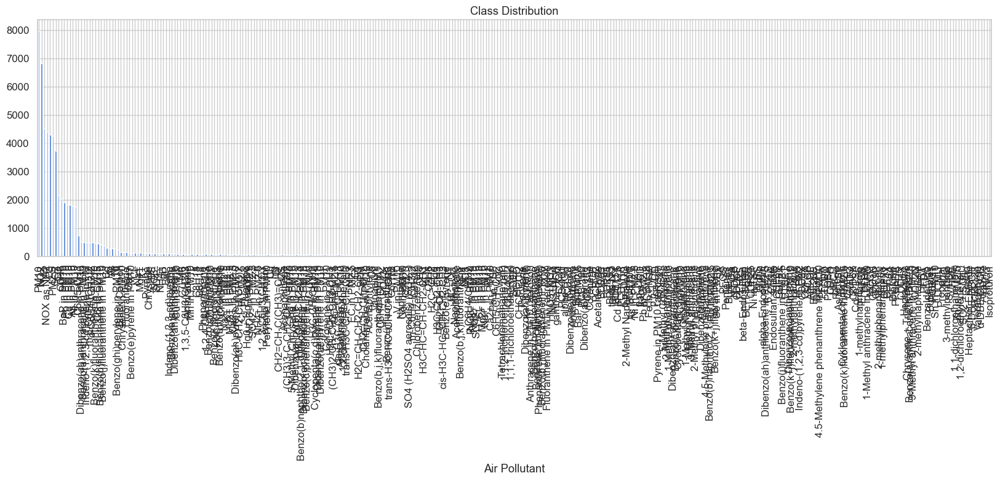

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

#  y_train contains true labels
class_counts = y_train.value_counts()
class_counts.plot(kind='bar', figsize=(20,5))
plt.title("Class Distribution")
plt.show()


In [17]:
# --- Imports ---
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import classification_report

# --- Split dataset ---
# Assuming X and y are already defined
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# --- Identify categorical and numerical features ---
categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()

# --- Preprocessing ---
# For high-cardinality categorical features, use OrdinalEncoder
categorical_transformer = OneHotEncoder(handle_unknown='ignore', sparse=True)
numerical_transformer = StandardScaler()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ],
    sparse_threshold=0.3  # keep sparse matrices for high-cardinality features
)

# --- Build memory-efficient pipeline ---
model = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', HistGradientBoostingClassifier(
        max_iter=100,
        max_depth=10,
        learning_rate=0.1,
        random_state=42
    ))
])

# --- Train model ---
model.fit(X_train, y_train)

# --- Predictions and evaluation ---
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))


NameError: name 'X' is not defined